# PREPROCESSING NOTEBOOK


In [1]:
import numpy as np
import os 
import pathlib
from PIL import Image
import skimage
import xml.etree.ElementTree as ET
import pandas as pd
from matplotlib import pyplot as plt
np.random.seed(42)

In [12]:
# Separação dos datasets em treino, validação e teste
# Criação dos patches nos datasets necessarios [img] > 256
# Normalização das cores


In [2]:
WORKING_DIRECTORY = pathlib.Path(os.getcwd())
INTERIM_PATH = pathlib.Path(WORKING_DIRECTORY.parent, 'data', 'interim')
PROCESSED_PATH = pathlib.Path(WORKING_DIRECTORY.parent, 'data', 'processed')

In [3]:
def create_patches(image, patch_size=256):
    """
    Create patches from an image.
    """
    patches = []
    for i in range(0, image.shape[0], patch_size):
        for j in range(0, image.shape[1], patch_size):
            patch = image[i:i+patch_size, j:j+patch_size]
            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                patches.append(patch)
    return patches

def xml_to_numpy(xml_path, image_shape=(1000,1000)): #developed with AI assit
    """
    Convert XML annotations to a numpy array.
    """
    mask = np.zeros(image_shape, dtype=np.uint8)
    tree = ET.parse(xml_path)
    root = tree.getroot()
    
    for region in root.iter('Region'):
        vertices = region.find('Vertices')
        points = []
        for vertex in vertices.iter('Vertex'):
            x = int(float(vertex.get('X')))
            y = int(float(vertex.get('Y')))
            points.append((x, y))
        
        # Create a mask for the region
        if points:
            points = np.array(points)
            skimage.draw.polygon(points[:, 1], points[:, 0], mask.shape)
            mask[skimage.draw.polygon(points[:, 1], points[:, 0], mask.shape)] = 1
    
    return mask


# MoNuSeg Processing

MoNuSeg has .tiff images and .xml masks, we need to convert them to .npy arrays and save them in the Processed folder for later use. We will also create patches of size 224x224 for training and validation.

In [15]:
monuseg_path = pathlib.Path(INTERIM_PATH, 'MoNuSeg')
if not monuseg_path.exists():
    raise FileNotFoundError(f'{monuseg_path} does not exist. Please run installation notebook.')

proc_monuseg_path = pathlib.Path(PROCESSED_PATH, 'MoNuSeg')
if not proc_monuseg_path.exists():
    proc_monuseg_path.mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_monuseg_path, 'Images').mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_monuseg_path, 'Masks').mkdir(parents=True, exist_ok=True)

#processing images
#=================================================================================================
monuseg_images_path = pathlib.Path(monuseg_path, 'Images')
monuseg_images_files = pd.read_csv(pathlib.Path(monuseg_path, 'labels.csv'))['FileName'].tolist()



proc_monuseg_images_path = pathlib.Path(proc_monuseg_path, 'Images')
proc_monuseg_path_masks_path = pathlib.Path(proc_monuseg_path, 'Masks')
files = []
for image_file in monuseg_images_files:
    image = Image.open(monuseg_images_path / (image_file + '.tif'))
    image_array = np.array(image)
    print(f'{image_file} shape: {image_array.shape}')
    print("Creating patches...")
    patches = create_patches(image_array)
    print(f'{len(patches)} patches created for {image_file}')
    for idx, patch in enumerate(patches):
        filename = (image_file + '_' + str(idx))
        filedir = pathlib.Path(proc_monuseg_images_path, image_file + '_' + str(idx) + '.npy')
        np.save(filedir, patch)
        files.append(filename)
files_df = pd.DataFrame(files, columns=['FileName'])
files_df.to_csv(pathlib.Path(proc_monuseg_path, 'labels.csv'), index=False)
#=================================================================================================

#processing masks
#=================================================================================================
monuseg_masks_path = pathlib.Path(monuseg_path, 'Masks')
proc_monuseg_masks_path = pathlib.Path(proc_monuseg_path, 'Masks')
files = []
for image_file in monuseg_images_files:
    mask = monuseg_masks_path / (image_file + '.xml')
    mask_array = xml_to_numpy(mask)
    print(f'{image_file} mask shape: {mask_array.shape}')
    print("Creating patches...")
    patches = create_patches(mask_array)
    print(f'{len(patches)} patches created for {image_file} mask')
    for idx, patch in enumerate(patches):
        if patch.max() > 1:
            print(f"Warning: {image_file} mask has values greater than 1... normalizing.")
            patch = np.where(patch > 0, 1, 0)  # Ensure binary masks
        
        filename = (image_file + '_' + str(idx))
        filedir = pathlib.Path(proc_monuseg_masks_path, image_file + '_' + str(idx) + '.npy')
        np.save(filedir, patch)
        files.append(filename)
files_df = pd.DataFrame(files, columns=['FileName'])
files_df['split'] = np.random.choice(['train', 'val', 'test'], size=len(files_df), p=[0.7, 0.15, 0.15])
files_df.to_csv(pathlib.Path(proc_monuseg_path, 'labels.csv'), index=False)
#=================================================================================================

TCGA-18-5592-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-18-5592-01Z-00-DX1
TCGA-21-5784-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-21-5784-01Z-00-DX1
TCGA-21-5786-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-21-5786-01Z-00-DX1
TCGA-38-6178-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-38-6178-01Z-00-DX1
TCGA-49-4488-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-49-4488-01Z-00-DX1
TCGA-50-5931-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-50-5931-01Z-00-DX1
TCGA-A7-A13E-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-A7-A13E-01Z-00-DX1
TCGA-A7-A13F-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-A7-A13F-01Z-00-DX1
TCGA-AR-A1AK-01Z-00-DX1 shape: (1000, 1000, 3)
Creating patches...
9 patches created for TCGA-AR

0 1


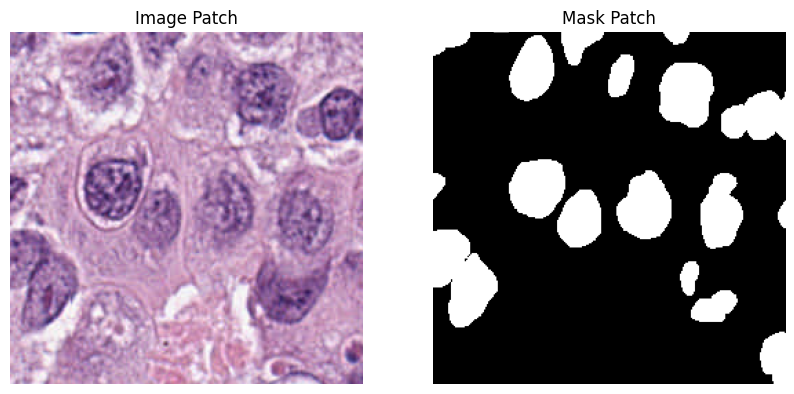

0 1


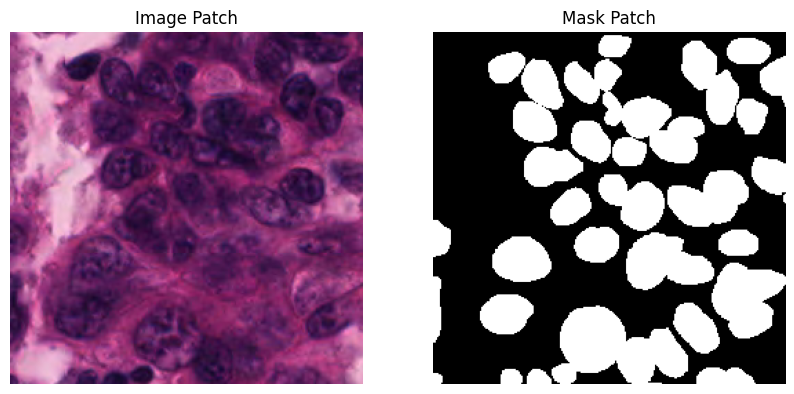

0 1


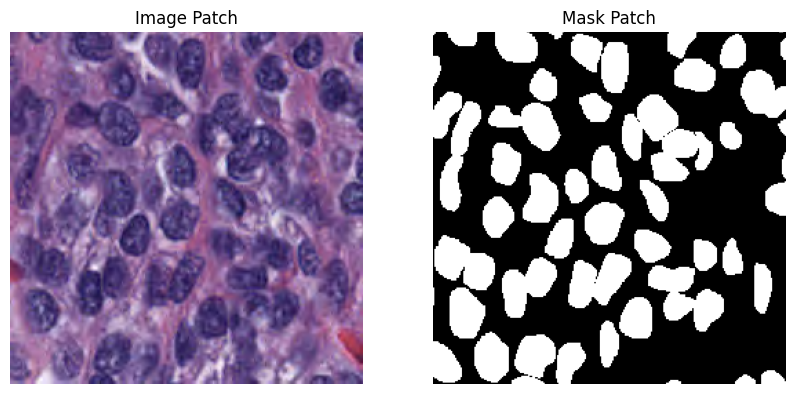

0 1


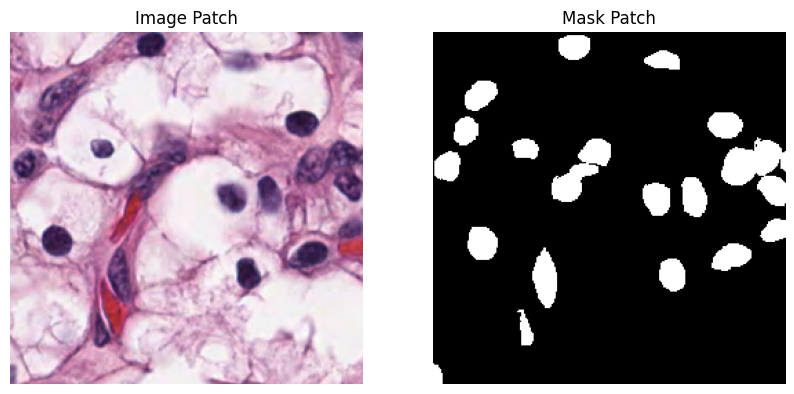

0 1


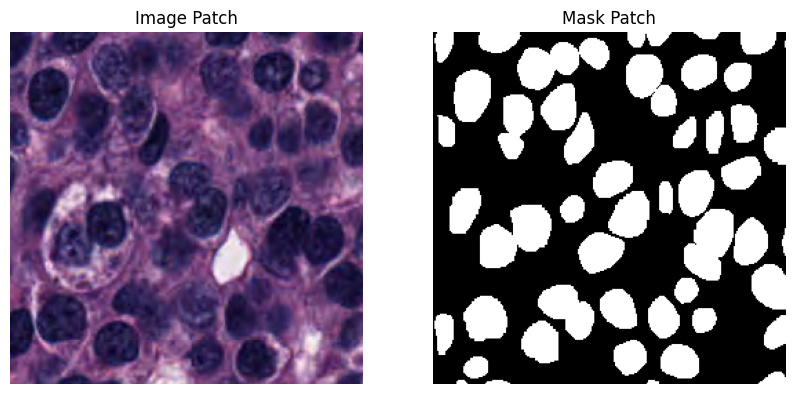

0 1


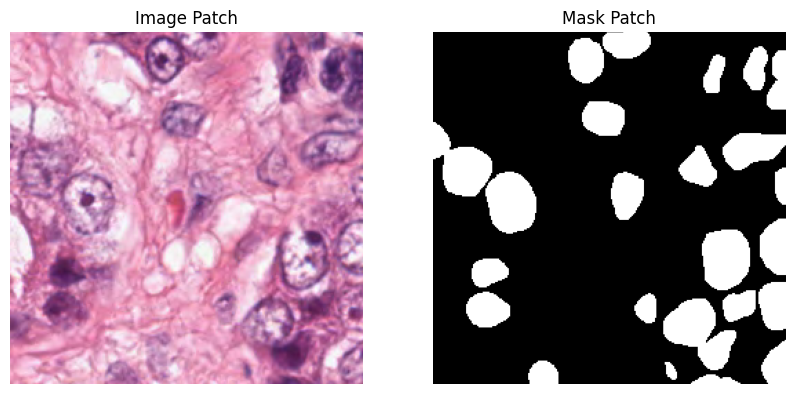

0 1


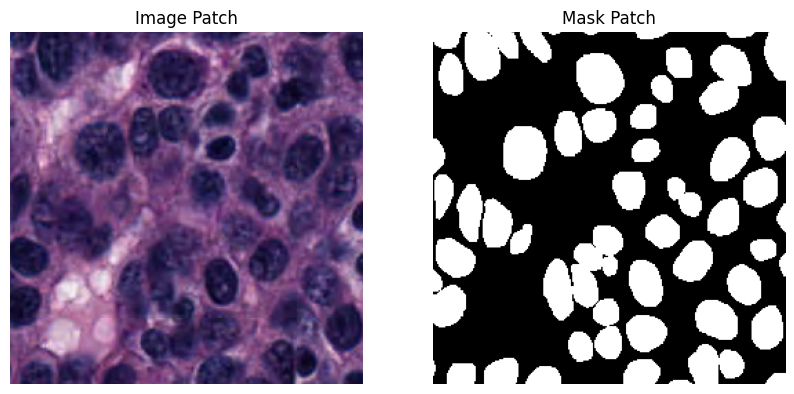

0 1


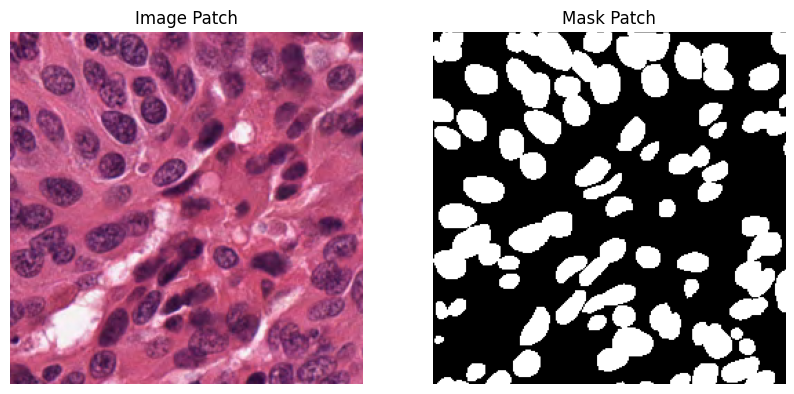

0 1


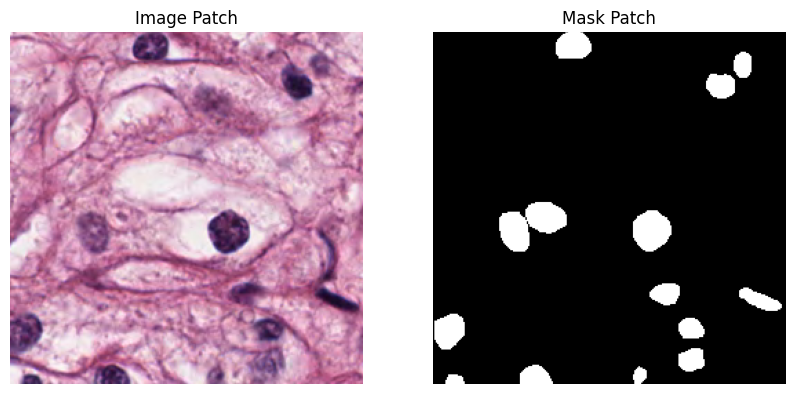

0 1


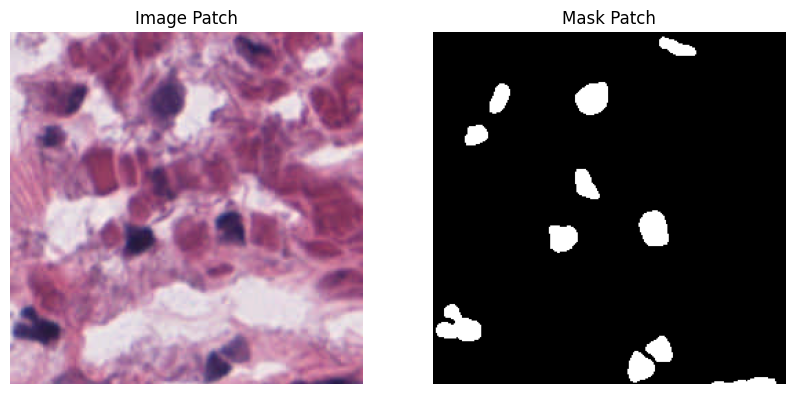

In [16]:
# patches QA

for files in files_df.sample(10)['FileName']:
    image_patch = np.load(proc_monuseg_images_path / (files + '.npy'))
    mask_patch = np.load(proc_monuseg_masks_path / (files + '.npy'))
    print(mask_patch.min(), mask_patch.max())

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_patch)
    plt.title('Image Patch')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask_patch, cmap='gray')
    plt.title('Mask Patch')
    plt.axis('off')
    
    plt.show()

# PanNuke Processing

PanNuke images are already in .npy format. The masks have 6 channels for each cell classification and background, we need to merge the 0-4 channels and exclude the bg one

In [9]:
pannuke_path = pathlib.Path(INTERIM_PATH, 'PanNuke')
if not pannuke_path.exists():
    raise FileNotFoundError(f'{pannuke_path} does not exist. Please run installation notebook.')

proc_panuke_path = pathlib.Path(PROCESSED_PATH, 'PanNuke')
if not proc_panuke_path.exists():
    proc_panuke_path.mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_panuke_path, 'Images').mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_panuke_path, 'Masks').mkdir(parents=True, exist_ok=True)

labels = pd.read_csv(pathlib.Path(pannuke_path, 'labels.csv'))

#================================================================================================
PanNuke_images = [pannuke_path / 'Images' / (f'fold{i+1}' + '.npy') for i in range(3)]
PanNuke_masks = [pannuke_path / 'Masks' / (f'fold{i+1}' + '.npy') for i in range(3)]

proc_images = []
proc_masks = []
files = []
c = 0
for idx in range(len(PanNuke_images)):
    images = np.load(PanNuke_images[idx])
    masks = np.load(PanNuke_masks[idx])
    for idx2 in range(images.shape[0]):
        image = images[idx2]
        mask = masks[idx2]
        print(f'Processing image {c} with shape: {image.shape}')
        mask = mask[:,:,0:5]
        mask = np.sum(mask, axis=2) 
        mask[mask > 0] = 1

        print(f'Altered mask shape: {mask.shape}') 
    
        np.save(pathlib.Path(proc_panuke_path, 'Images', str(c) + '.npy'), image)
        np.save(pathlib.Path(proc_panuke_path, 'Masks', str(c) + '.npy'), mask)
        c += 1
  
labels.to_csv(pathlib.Path(proc_panuke_path, 'labels.csv'), index=False)
labels['split'] = np.random.choice(['train', 'val', 'test'], size=len(labels), p=[0.7, 0.15, 0.15])
labels.to_csv(pathlib.Path(proc_panuke_path, 'labels.csv'), index=False)
#===============================================================================

Processing image 0 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 1 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 2 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 3 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 4 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 5 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 6 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 7 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 8 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 9 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 10 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 11 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processing image 12 with shape: (256, 256, 3)
Altered mask shape: (256, 256)
Processin

4795


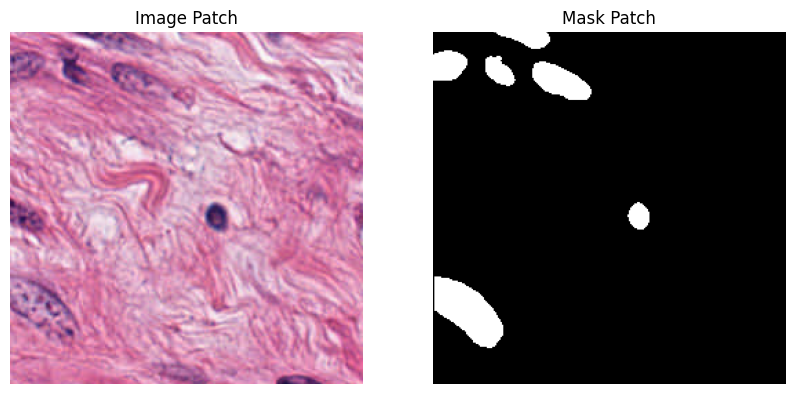

3431


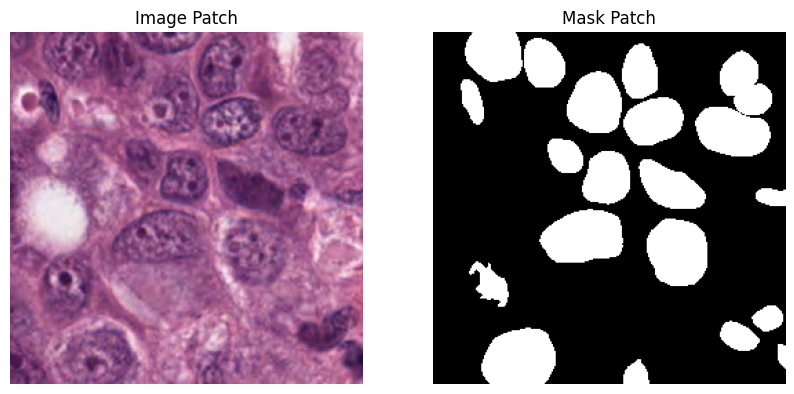

2724


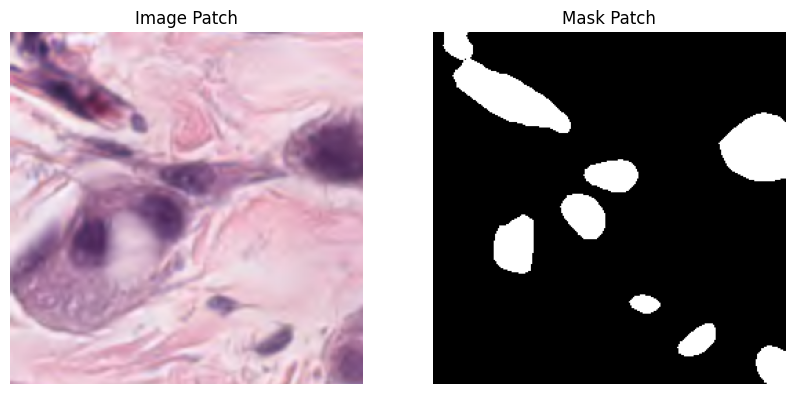

350


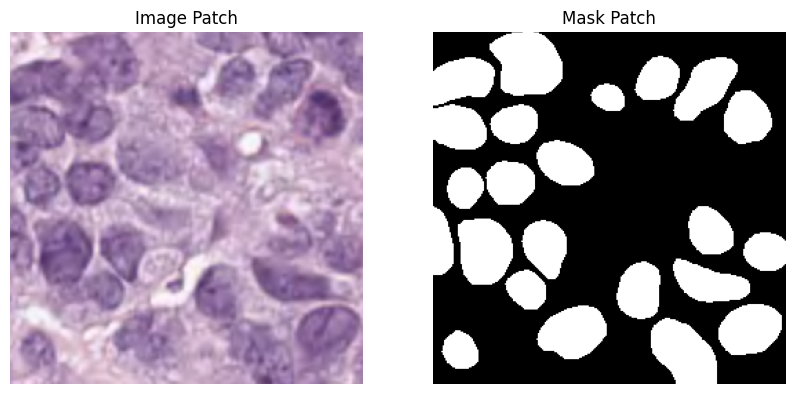

4201


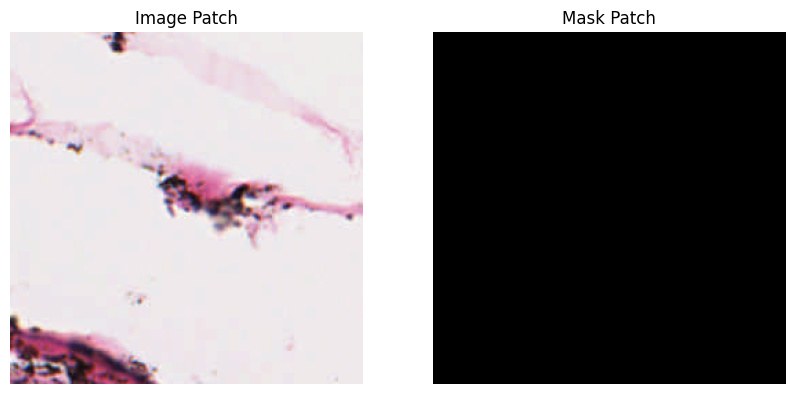

657


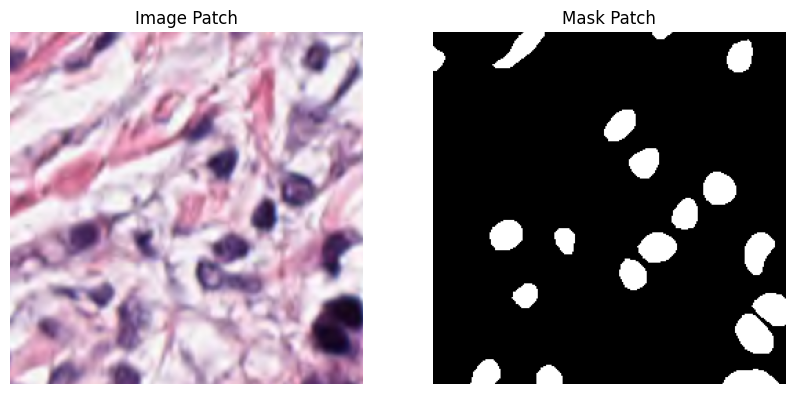

4549


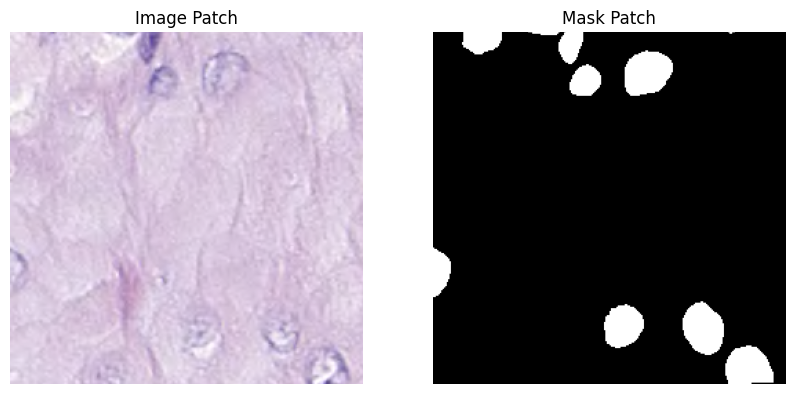

5149


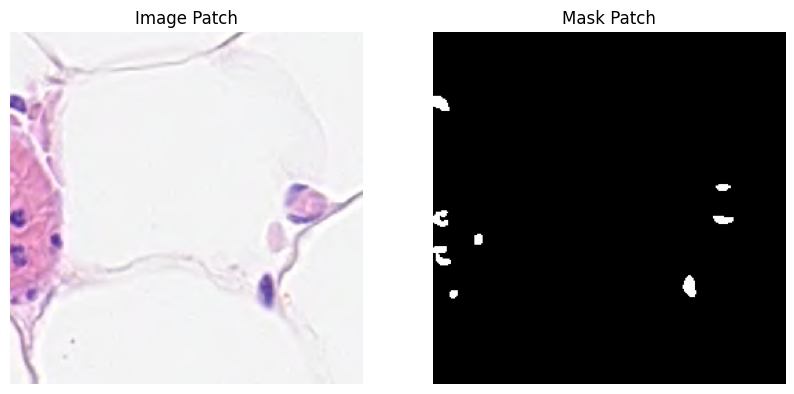

3272


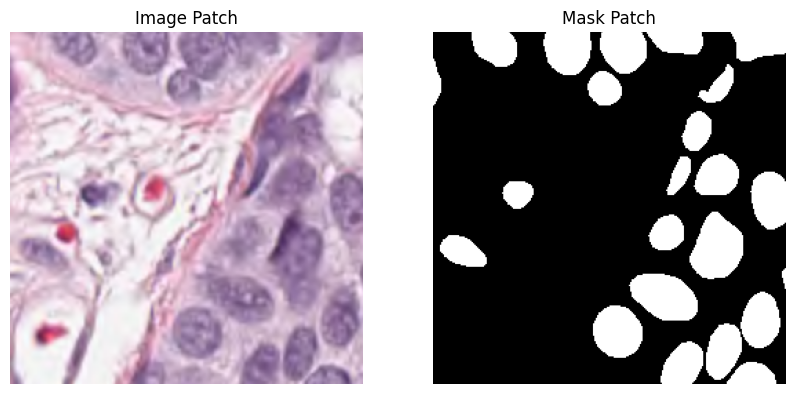

2766


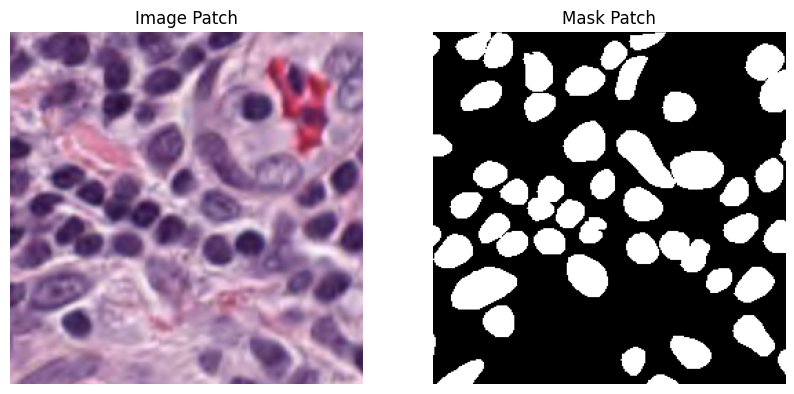

In [10]:
# PanNuke QA

for files in labels.sample(10)['FileName']:
    image_patch = np.load(proc_panuke_path / 'Images' / (str(files) + '.npy')).astype(np.uint8)
    mask_patch = np.load(proc_panuke_path / 'Masks' / (str(files) + '.npy'))

    print(files)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_patch)
    plt.title('Image Patch')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask_patch, cmap='gray')
    plt.title('Mask Patch')
    plt.axis('off')
    
    plt.show()

# NuInSeg Processing
NuInSeg has .jpg files that we need to convert to .npy

In [19]:
nuinseg_path = pathlib.Path(INTERIM_PATH, 'NuInSeg')
if not nuinseg_path.exists():
    raise FileNotFoundError(f'{nuinseg_path} does not exist. Please run installation notebook.')

proc_nuinseg_path = pathlib.Path(PROCESSED_PATH, 'NuInSeg')
if not proc_nuinseg_path.exists():
    proc_nuinseg_path.mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_nuinseg_path, 'Images').mkdir(parents=True, exist_ok=True)
    pathlib.Path(proc_nuinseg_path, 'Masks').mkdir(parents=True, exist_ok=True)

labels = pd.read_csv(pathlib.Path(nuinseg_path, 'labels.csv'))

# ================================================================================================
new_labels = []
for label in labels['FileName']:
    image = Image.open(pathlib.Path(nuinseg_path, 'Images', label + '.png'))
    mask = Image.open(pathlib.Path(nuinseg_path, 'Masks', label + '.png'))
    
    image_array = np.array(image)
    mask_array = np.array(mask)
    
    if image_array.shape != (512, 512, 3):
        print(f"File {label} has image shape {image_array.shape}, expected (512, 512, 3)")
        image_array = image_array[:,:,:3]  # Keep only the first 3 channels
    print('Original image shape:', image_array.shape)
    print('Original mask shape:', mask_array.shape)

    print('Generating patches...')
    image_patches = create_patches(image_array)
    mask_patches = create_patches(mask_array)
    print('Patch size:', image_patches[0].shape)
    print('Patch size:', mask_patches[0].shape)
    print(f'Generated {len(image_patches)} patches for image and mask {label}')
    for idx, (img_patch, mask_patch) in enumerate(zip(image_patches, mask_patches)):
        if mask_patch.max() > 1:
            print(f"Warning: {label} mask has values greater than 1... normalizing.")
            mask_patch = np.where(mask_patch > 0, 1, 0)  # Ensure binary masks

        patch_filename = f'{label}_{idx}'
        np.save(pathlib.Path(proc_nuinseg_path, 'Images', patch_filename + '.npy'), img_patch)
        np.save(pathlib.Path(proc_nuinseg_path, 'Masks', patch_filename + '.npy'), mask_patch)
        new_labels.append(patch_filename)

labels = pd.DataFrame(new_labels, columns=['FileName'])
labels['split'] = np.random.choice(['train', 'val', 'test'], size=len(labels), p=[0.7, 0.15, 0.15])
labels.to_csv(pathlib.Path(proc_nuinseg_path, 'labels.csv'), index=False)
#===============================================================================

Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_bladder_01
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_bladder_02
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_bladder_03
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_bladder_04
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_bladder_05
Original image shape: (51

Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_liver_29
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_liver_30
File human_liver_31 has image shape (512, 512, 4), expected (512, 512, 3)
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_liver_31
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 patches for image and mask human_liver_32
Original image shape: (512, 512, 3)
Original mask shape: (512, 512)
Generating patches...
Patch size: (256, 256, 3)
Patch size: (256, 256)
Generated 4 pat

0 1


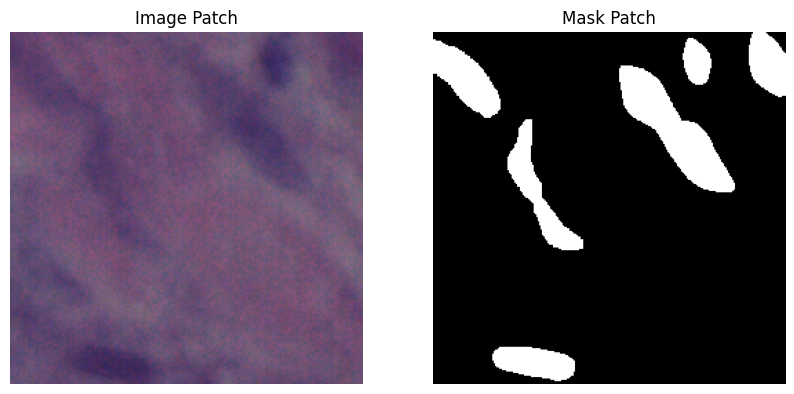

0 1


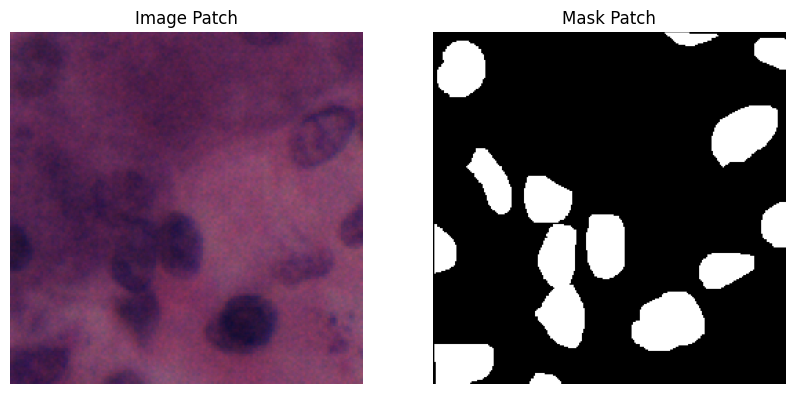

0 1


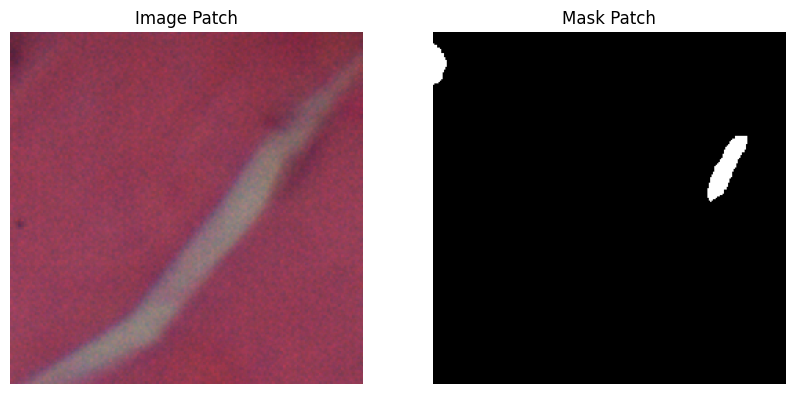

0 1


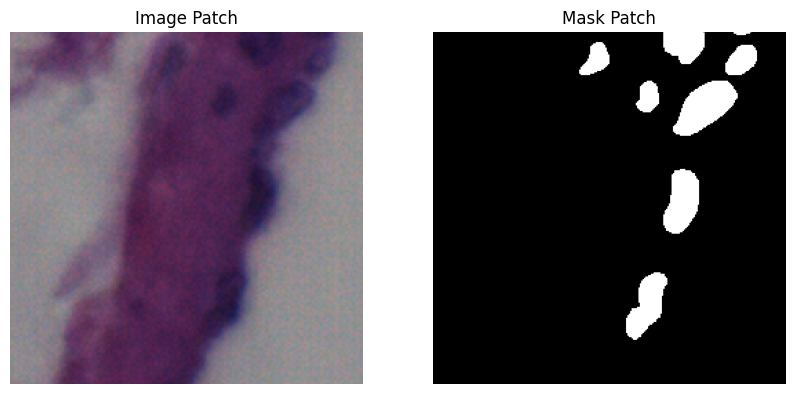

0 1


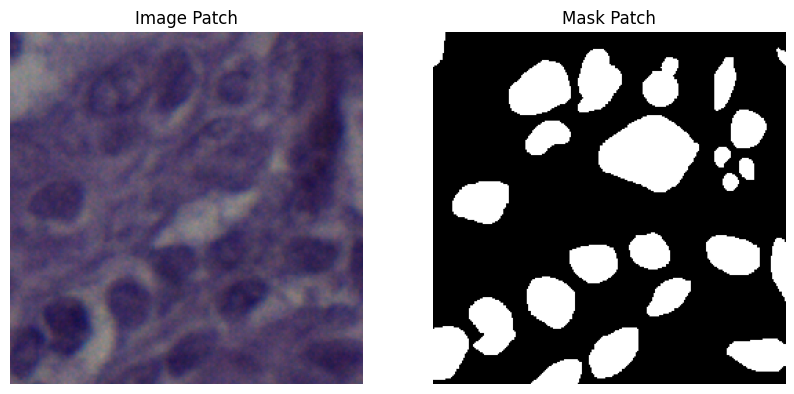

0 1


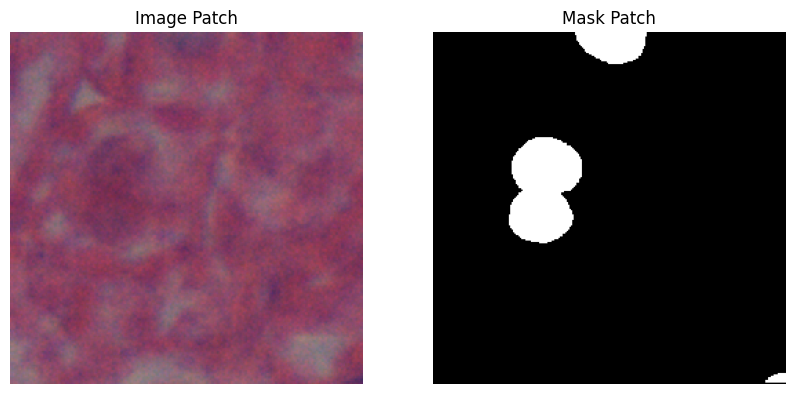

0 1


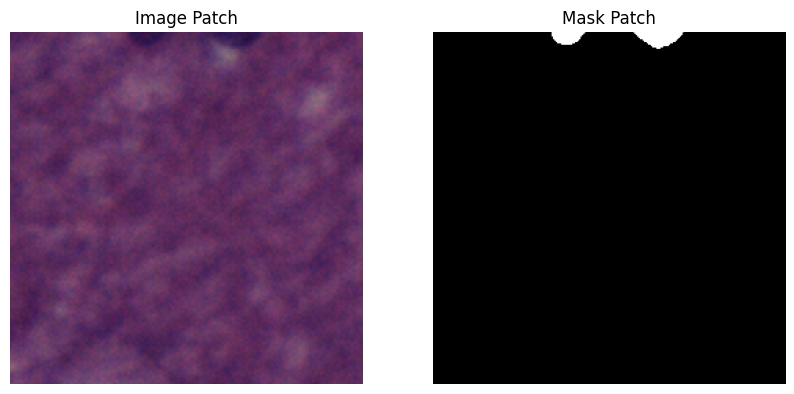

0 1


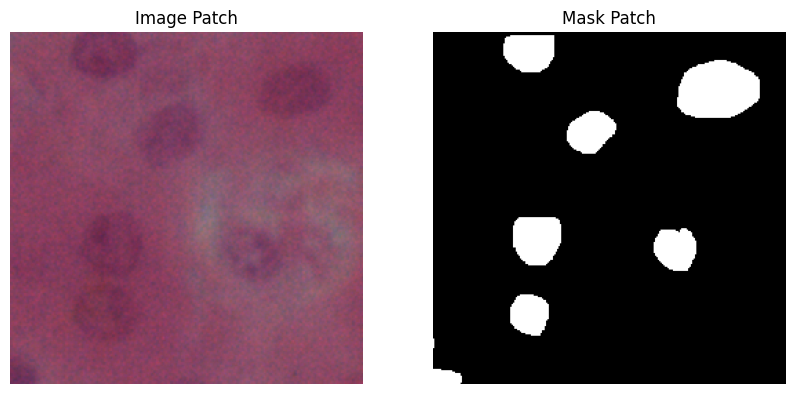

0 1


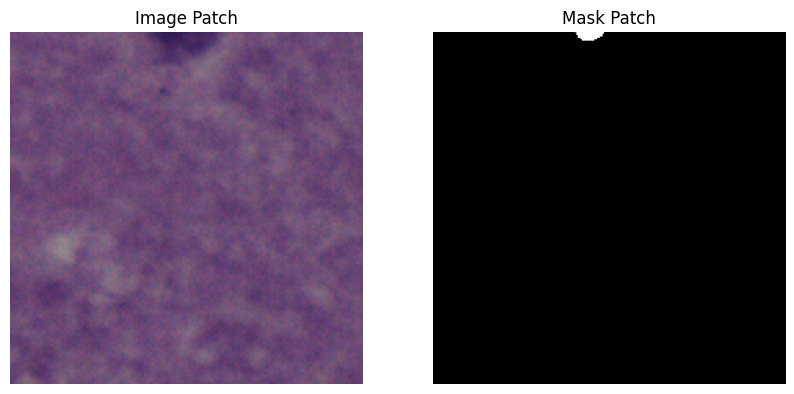

0 1


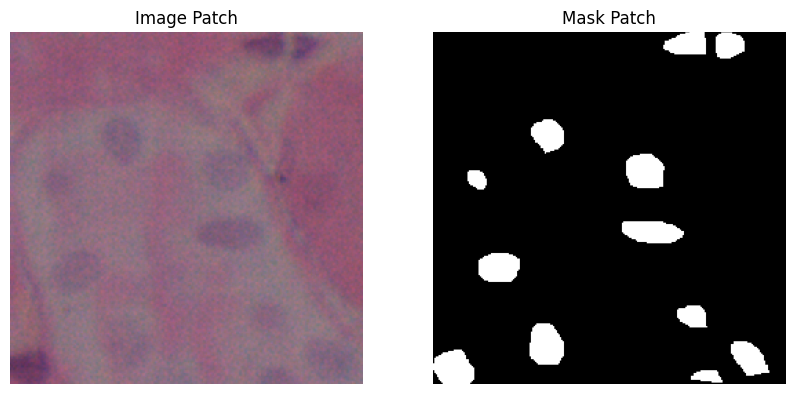

In [20]:
# patches QA

for files in labels.sample(10)['FileName']:
    image_patch = np.load(proc_nuinseg_path / 'Images' / (files + '.npy'))
    mask_patch = np.load(proc_nuinseg_path / 'Masks' / (files + '.npy'))

    print(mask_patch.min(), mask_patch.max())

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_patch)
    plt.title('Image Patch')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(mask_patch, cmap='gray')
    plt.title('Mask Patch')
    plt.axis('off')
    
    plt.show()